In [15]:
import pandas as pd
import numpy as np
import pickle
import os

from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split, LeaveOneOut, KFold

In [16]:
data = pd.read_csv("../Datasets/content_based_dataset_stems.csv")
data


,boardgame_id,boardgame_name,main_tags
0,30549,Pandemic,in pandem sever virul diseas have broken out s...
1,822,Carcassonne,carcassonn is a tileplac game in which the pla...
2,13,Catan,in catan formerli the settler of catan player ...
3,68448,7 Wonders,you are the leader of one of the 7 great citi ...
4,36218,Dominion,quotyou are a monarch like your parent befor y...
...,...,...,...
20583,16874,Vince Lombardi's Game,quotvinc lombardi gamequot is a footbal simul ...
20584,3589,Beast Wars Transformers Mutating Card Game,from the boxth beast war have begun choos side...
20585,296892,Sacred Rites,it ha come time to honor the tradit of the pas...
20586,10052,Bongo Kongo,each player take a posit adjac to one of the f...


In [17]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
cv = CountVectorizer(max_features=5000, stop_words="english")
vector = cv.fit_transform(data["main_tags"])
similary = cosine_similarity(vector)

distances = sorted(list(enumerate(similary[0])), reverse= True, key= lambda x : x[1])
for distance in distances:
    print(distance)

KeyboardInterrupt: 

In [ ]:
for i in data.index:
    print(i)
    distances = sorted(list(enumerate(similary[i])), reverse= True, key= lambda x : x[1])

    distance = [j for k, j in distances]

    average_distances = np.mean(distance[1:10 + 1])
    # ad_list.append(len(average_distances[average_distances > 0.75]) / len(average_distances))
    print(average_distances)
    break

0
0.7920269917346052


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
cv = CountVectorizer(max_features=5000, stop_words="english")
kfold = KFold(n_splits=5)
ad_list = []

vector = cv.fit_transform(data["main_tags"])
similary = cosine_similarity(vector)

average_distances_list = []
for i in data["boardgame_name"]:
        index  = data[data["boardgame_name"] == i].index[0]
        distances = sorted(list(enumerate(similary[index])), reverse= True, key= lambda x : x[1])
        distance = [j for k, j in distances]
        average_distances = np.mean(distance[1:10 + 1])
        average_distances_list.append(average_distances)
average_distances_threshold = [ i for i in average_distances_list if i > 0.6]
mean_threshold = len(average_distances_threshold) / len(average_distances_list)

# average_distances_list

mean_threshold
# sum(ad_list) / len(ad_list)

0.30109772683116376

In [ ]:
average_distances_threshold

[0.9486069171901432,
 0.943891568286445,
 0.9468953605822262,
 0.9530401989145452,
 0.9476494868435715,
 0.9495341977845232,
 0.9424760843886586,
 0.9505223610405282,
 0.9190704692782707,
 0.9574944368277254,
 0.9599519757278829,
 0.9490262400144245,
 0.9522235957497344,
 0.9355909154046481,
 0.9066555795687847,
 0.9429852610536884,
 0.9210050576589396,
 0.9471316710127751,
 0.9474983426231777,
 0.923924874241607,
 0.9293274375858032,
 0.9316231688209303,
 0.941755152314693,
 0.9472143635782111,
 0.9534101366203471,
 0.9306766862965624,
 0.9314260973225,
 0.9324444944129828,
 0.9066401294597359,
 0.9153695096747709,
 0.9438778544627683,
 0.952268196908481,
 0.9556631711028765,
 0.940837073179774,
 0.9253768541101325,
 0.94242064947755,
 0.9284203242421045,
 0.9266533211213062,
 0.9556550324771784,
 0.9382084094367595,
 0.9212148851400681,
 0.9139744690554767,
 0.9247203520427136,
 0.932090210481784,
 0.9506940962646553,
 0.9470632414583717,
 0.9388776868737274,
 0.9370212725721379,
 0.

In [ ]:
k = [0.5, 0.6, 0.7, 0.8, 0.9]
count_over_threshold = []
sim_over_threshold = []
for ks in k:
    average_distances_threshold = [ i for i in average_distances_list if i > ks]
    mean_threshold = len(average_distances_threshold) / len(average_distances_list)
    sim_over_threshold.append(mean_threshold)
    mean_threshold = np.mean(average_distances_threshold)
    count_over_threshold.append(mean_threshold)
sim_over_threshold

# average_distances_list

# mean_threshold

[0.8368952788031864,
 0.632552943462211,
 0.4056246357101224,
 0.20871381387215854,
 0.046191956479502624]

In [ ]:
df_tesst = pd.DataFrame([k,sim_over_threshold]).T
df_tesst

,0,1
0,0.5,0.836895
1,0.6,0.632553
2,0.7,0.405625
3,0.8,0.208714
4,0.9,0.046192


In [ ]:
df_tesst.iloc[:, 0]

0    0.5
1    0.6
2    0.7
3    0.8
4    0.9
Name: 0, dtype: float64

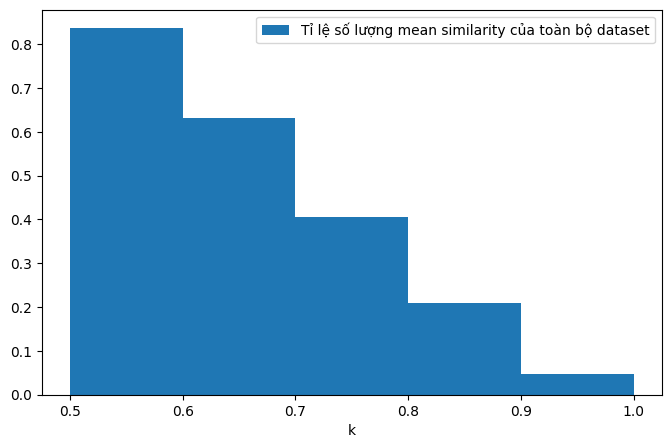

In [ ]:
import matplotlib.pyplot as plt
# ks = list(range(1, 13987))
# 
# x = np.arange(len(sim_over_threshold))


plt.figure(figsize=(8, 5))
plt.bar(df_tesst.iloc[:, 0], df_tesst.iloc[:, 1], align="edge",width=0.1)
plt.xlabel("k")
# Thiết lập phạm vi trục x từ index 1 đến index 3 (tương ứng với 'Category B' đến 'Category D')
plt.legend(["Tỉ lệ số lượng mean similarity của toàn bộ dataset", "Tỉ lệ mean similarity của toàn bộ dataset"])
plt.show()

In [ ]:
average_distances_list = []
for i in data.index:
        distances = sorted(list(enumerate(similary[i])), reverse= True, key= lambda x : x[1])
        distance = [j for k, j in distances]
        average_distances = np.mean(distance[1:10 + 1])
        average_distances_list.append(average_distances)
average_distances_threshold = [ d for d in average_distances_list if d > 0.75]
mean_threshold = len(average_distances_threshold) / len(average_distances_threshold)

In [ ]:
average_distances_threshold = [ d for d in average_distances_list if d > 0.5]
mean_threshold = len(average_distances_threshold) / len(average_distances_list)
len(average_distances_threshold)

17174

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
cv = CountVectorizer(max_features=5000, stop_words="english")
kfold = KFold(n_splits=5)
ad_list = []
for train_indx, test_indx in kfold.split(data):
    train, test = data.iloc[train_indx, :], data.iloc[test_indx, :]
    vector = cv.fit_transform(train["main_tags"])
    similary = cosine_similarity(vector)

    average_distances_list = []
    for i in test["boardgame_name"]:
            index  = test[test["boardgame_name"] == i].index[0]
            distances = sorted(list(enumerate(similary[index])), reverse= True, key= lambda x : x[1])
            distance = [j for k, j in distances]
            average_distances = np.mean(distance[1:10 + 1])
            average_distances_list.append(average_distances)
    
    average_distances_threshold = [ i for i in average_distances_list if i > 0.75]
    mean_threshold = len(average_distances_threshold) / len(average_distances_list)
    ad_list.append(mean_threshold)


sum(ad_list) / len(ad_list)

IndexError: index 16471 is out of bounds for axis 0 with size 16471

In [ ]:
len(similary)

16471

In [ ]:
data.columns

Index(['user_name', 'rating', 'comment', 'boardgame_id', 'boardgame_name'], dtype='object')

In [ ]:
data = data[['user_name', 'rating',  'boardgame_name']]

In [ ]:
train , test = train_test_split(data, random_state=42,test_size=0.2)
train

,user_name,rating,comment,boardgame_id,boardgame_name
485499,Spielemitkinder,8.0,"Unique and fun theme, which is important for m...",36946,Red November
655897,spriggyman,7.0,Don't take it too seriously and this game can ...,37738,Master Builder
257403,MusashiDaryl,8.0,,17405,1846: The Race for the Midwest
128187,Cyberian,4.0,"Rolling a dice again and again, without any in...",1174,Minister
622945,deadwringer,10.0,With 2 promo cards.,122159,Cthulhu Fluxx
...,...,...,...,...,...
259178,Stenun,5.0,Review: https://boardgamegeek.com/thread/17357...,167763,DC Comics Deck-Building Game: Teen Titans
365838,SgtCantamal,8.0,"Regalo cumpleaños de Jordi, María y Xavi",200680,Agricola (Revised Edition)
131932,JrStrange,8.0,Lost in fire. Plan to replace: Yes.,34635,Stone Age
671155,tcmaka,8.0,犯人と警察,438,Scotland Yard


In [ ]:
test = test[['user_name', 'rating',  'boardgame_name']]

In [ ]:
train.to_csv("artifacts/data_train.csv", index= False)
test.to_csv("artifacts/data_test.csv", index= False)

In [ ]:
test = test[['user_name', 'rating',  'boardgame_name']]

In [ ]:
## Create Matrix for the User_Boardgame Interaction using pivot function
bg_pivot = train.pivot_table(columns="user_name", index="boardgame_name", values="rating")
bg_pivot.fillna(0.0, inplace= True)

In [ ]:
model = NearestNeighbors(metric="cosine", algorithm="brute")
model.fit(bg_pivot)

NearestNeighbors(algorithm='brute', metric='cosine')

In [ ]:
def collaborative_filtering_RS(model, boardgame_name, bg_pivot, k):
    bg_names = []
    boardgame_idx = np.where(bg_pivot.index == boardgame_name)[0][0]
    print(boardgame_idx)
    return
    distance, boardgame_idx_corr = model.kneighbors(bg_pivot.iloc[boardgame_idx, :].values.reshape(1,-1), n_neighbors=k)
    ## Item-based Recommendation Systems

    col_names = bg_pivot.index[boardgame_idx_corr[0]].tolist()
    zipped = list(zip(col_names[1:], distance[1:])) # bỏ chính nó
    sort = sorted(zipped, key=lambda x : x[1])
    # items_dict[boardgame_name] = sort
    for i in range(len(sort)):
        bg_names.append(sort[i][0])
    return bg_names

SyntaxError: 'break' outside loop (597077733.py, line 5)

#### Test

In [ ]:
## Create Matrix for the User_Boardgame Interaction using pivot function
bg_pivot_test = test.pivot_table(columns="user_name", index="boardgame_name", values="rating")
bg_pivot_test.fillna(0.0, inplace= True)

In [ ]:
bg_pivot_test

user_name,-Johnny-,-LucaS-,-Morphling-,-mIDE-,-xXx-,.JcK.,0 1 1 2 3 5 8,01151125,0122lostchild2201,030670628,...,zyklonc,zylan,zyrain,zyreg,zz2282,zzas,zztap,zzzabiss,zzzeagle,zzzoren
boardgame_name,,,,,,,,,,,,,,,,,,,,,
"""Oh My God! There's An Axe In My Head."" The Game of International Diplomacy",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""Scratch One Flat Top!""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""Tarleton's Quarter!""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
#MyLife,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
'65: Squad-Level Combat in the Jungles of Vietnam,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
イラストリー (Illustori),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
キャットインザボックス (Cat in the box),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ドキッと！アイス (Dokitto! Ice),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:

# Tính ma trận tương quan Spearman
correlation_matrix = bg_pivot_test.T.corr(method='spearman')
# Tạo DataFrame từ ma trận tương quan với tên cột
correlation_df = pd.DataFrame(correlation_matrix, columns=bg_pivot_test.index, index=bg_pivot_test.index)

print("Ma trận tương quan:")
display(correlation_df)

In [ ]:
def corr_pearson(bg_pivot_test):
    # Chuyển DataFrame thành mảng NumPy
    matrix = bg_pivot_test.to_numpy()

    # Tính ma trận tương quan
    correlation_matrix = np.corrcoef(matrix, rowvar=True)

    # Tạo DataFrame từ ma trận tương quan với tên cột
    correlation_df = pd.DataFrame(correlation_matrix, columns=bg_pivot_test.index, index=bg_pivot_test.index)

    print("Ma trận tương quan:")
    display(correlation_df)
    
    return correlation_df

In [ ]:
def item_relevant(correlation_df):
    bg_corr = {}
    bg_corr_non_rate = {}
    for i in correlation_df.columns:
        value = correlation_df[correlation_df[i] > 0.1][i].values
        boardgame_corr = correlation_df[correlation_df[i] > 0.1][i].index
        boardgame_corr = [i for i in boardgame_corr]
        zipped = list(zip(boardgame_corr[1:], value[1:]))
        sort = sorted(zipped, key=lambda x : x[1], reverse=True)
        bg_corr[i] = sort
        bg_corr_non_rate[i] = boardgame_corr[1:]
    
    return bg_corr, bg_corr_non_rate


In [ ]:
test

,user_name,rating,boardgame_name
122968,noobcitizen,5.0,Arkham Horror
606015,VuduJoie,4.0,Circus Flohcati
484431,Jimscannell,7.0,Notre Dame
397238,olivier6,9.0,Modern Art
422294,PatK,9.0,Abracada...What?
...,...,...,...
236089,GamerDad74,7.0,Clue FX
23455,Guiannos,7.0,Mottainai
156982,girlfridaygirl,8.0,Balloon Cup
147100,pmagnus,8.0,RoboRally


In [ ]:
correlation_df_test = corr_pearson(bg_pivot_test)
# correlation_df

Ma trận tương quan:


boardgame_name,"""Oh My God! There's An Axe In My Head."" The Game of International Diplomacy","""Scratch One Flat Top!""","""Tarleton's Quarter!""",#MyLife,'65: Squad-Level Combat in the Jungles of Vietnam,"'CA' Tactical Naval Warfare in the Pacific, 1941-45","'Wacht am Rhein': The Battle of the Bulge, 16 Dec 44 – 2 Jan 45",*Star,"...and then, we held hands.",...und tschüss!,...,Стартап,Страдающее средневековье (Medieval Suffering),€uro Crisis,なつめも (Natsumemo),ひとひら (Hitohira),イラストリー (Illustori),キャットインザボックス (Cat in the box),ドキッと！アイス (Dokitto! Ice),ワイルドハントフェス (Wild Hunt Festival),聖杯サクセション (Throne and the Grail)
boardgame_name,,,,,,,,,,,,,,,,,,,,,
"""Oh My God! There's An Axe In My Head."" The Game of International Diplomacy",1.000000,-0.000030,-0.000030,-0.000042,-0.000042,-0.000030,-0.000030,-0.000030,-0.000102,-0.000077,...,-0.000030,-0.000030,-0.000051,-0.000030,-0.000042,-0.000030,-0.000042,-0.000030,-0.000030,-0.000030
"""Scratch One Flat Top!""",-0.000030,1.000000,-0.000023,-0.000032,-0.000032,-0.000023,-0.000023,-0.000023,-0.000079,-0.000060,...,-0.000023,-0.000023,-0.000039,-0.000023,-0.000032,-0.000023,-0.000032,-0.000023,-0.000023,-0.000023
"""Tarleton's Quarter!""",-0.000030,-0.000023,1.000000,-0.000032,-0.000032,-0.000023,-0.000023,-0.000023,-0.000079,-0.000060,...,-0.000023,-0.000023,-0.000039,-0.000023,-0.000032,-0.000023,-0.000032,-0.000023,-0.000023,-0.000023
#MyLife,-0.000042,-0.000032,-0.000032,1.000000,-0.000045,-0.000032,-0.000032,-0.000032,-0.000111,-0.000084,...,-0.000032,-0.000032,-0.000056,-0.000032,-0.000045,-0.000032,-0.000046,-0.000032,-0.000032,-0.000032
'65: Squad-Level Combat in the Jungles of Vietnam,-0.000042,-0.000032,-0.000032,-0.000045,1.000000,-0.000032,-0.000032,-0.000032,-0.000110,-0.000084,...,-0.000032,-0.000032,-0.000055,-0.000032,-0.000045,-0.000032,-0.000045,-0.000032,-0.000032,-0.000032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
イラストリー (Illustori),-0.000030,-0.000023,-0.000023,-0.000032,-0.000032,-0.000023,-0.000023,-0.000023,-0.000079,-0.000060,...,-0.000023,-0.000023,-0.000039,-0.000023,-0.000032,1.000000,-0.000032,-0.000023,-0.000023,-0.000023
キャットインザボックス (Cat in the box),-0.000042,-0.000032,-0.000032,-0.000046,-0.000045,-0.000032,-0.000032,-0.000032,-0.000111,-0.000084,...,-0.000032,-0.000032,-0.000056,-0.000032,-0.000046,-0.000032,1.000000,-0.000032,-0.000032,-0.000032
ドキッと！アイス (Dokitto! Ice),-0.000030,-0.000023,-0.000023,-0.000032,-0.000032,-0.000023,-0.000023,-0.000023,-0.000079,-0.000060,...,-0.000023,-0.000023,-0.000039,-0.000023,-0.000032,-0.000023,-0.000032,1.000000,-0.000023,-0.000023


In [ ]:
correlation_df_test[correlation_df_test['#MyLife'] > 0.1]

boardgame_name,"""Oh My God! There's An Axe In My Head."" The Game of International Diplomacy","""Scratch One Flat Top!""","""Tarleton's Quarter!""",#MyLife,'65: Squad-Level Combat in the Jungles of Vietnam,"'CA' Tactical Naval Warfare in the Pacific, 1941-45","'Wacht am Rhein': The Battle of the Bulge, 16 Dec 44 – 2 Jan 45",*Star,"...and then, we held hands.",...und tschüss!,...,Стартап,Страдающее средневековье (Medieval Suffering),€uro Crisis,なつめも (Natsumemo),ひとひら (Hitohira),イラストリー (Illustori),キャットインザボックス (Cat in the box),ドキッと！アイス (Dokitto! Ice),ワイルドハントフェス (Wild Hunt Festival),聖杯サクセション (Throne and the Grail)
boardgame_name,,,,,,,,,,,,,,,,,,,,,
#MyLife,-0.000042,-0.000032,-0.000032,1.000000,-0.000045,-0.000032,-0.000032,-0.000032,-0.000111,-0.000084,...,-0.000032,-0.000032,-0.000056,-0.000032,-0.000045,-0.000032,-0.000046,-0.000032,-0.000032,-0.000032
Android: Infiltration,-0.000170,-0.000131,-0.000131,0.100164,-0.000184,-0.000131,-0.000131,-0.000131,-0.000451,-0.000341,...,-0.000131,-0.000131,-0.000226,-0.000131,-0.000185,-0.000131,-0.000185,-0.000131,-0.000131,-0.000131
Atlantis,-0.000111,-0.000085,-0.000085,0.176987,-0.000120,-0.000085,-0.000085,-0.000085,-0.000293,-0.000222,...,-0.000085,-0.000085,-0.000147,-0.000085,-0.000120,-0.000085,-0.000120,-0.000085,-0.000085,-0.000085
Byzantium,-0.000108,-0.000083,-0.000083,0.157182,-0.000117,-0.000083,-0.000083,-0.000083,-0.000287,-0.000217,...,-0.000083,-0.000083,-0.000144,-0.000083,-0.000118,-0.000083,-0.000118,-0.000083,-0.000083,-0.000083
Card City,-0.000051,-0.000040,-0.000040,0.387091,-0.000055,-0.000040,-0.000040,-0.000040,-0.000136,-0.000103,...,-0.000040,-0.000040,-0.000068,-0.000040,-0.000056,-0.000040,-0.000056,-0.000040,-0.000040,-0.000040
Clubs,-0.000083,-0.000064,-0.000064,0.204502,-0.000090,-0.000064,-0.000064,-0.000064,-0.000220,-0.000166,...,-0.000064,-0.000064,-0.000110,-0.000064,-0.000090,-0.000064,-0.000090,-0.000064,-0.000064,-0.000064
Cubiko,-0.000058,-0.000045,-0.000045,0.220182,-0.000063,-0.000045,-0.000045,-0.000045,-0.000154,-0.000117,...,-0.000045,-0.000045,-0.000077,-0.000045,-0.000063,-0.000045,-0.000063,-0.000045,-0.000045,-0.000045
Eight-Minute Empire: Legends,-0.000137,-0.000105,-0.000105,0.113356,-0.000148,-0.000105,-0.000105,-0.000105,-0.000362,-0.000274,...,0.236291,-0.000105,-0.000181,-0.000105,-0.000148,-0.000105,-0.000149,-0.000105,-0.000105,-0.000105
Empires,-0.000071,-0.000055,-0.000055,0.275978,-0.000077,-0.000055,-0.000055,-0.000055,-0.000189,-0.000143,...,-0.000055,-0.000055,-0.000095,-0.000055,-0.000077,-0.000055,-0.000078,-0.000055,-0.000055,-0.000055


In [ ]:
_ , dictionary_item_relevants = item_relevant(correlation_df_test)
dictionary_item_relevants

{'"Oh My God! There\'s An Axe In My Head." The Game of International Diplomacy ': ['Animocrazy 豬事議會'],
 '"Scratch One Flat Top!"': [],
 '"Tarleton\'s Quarter!"': [],
 '#MyLife': ['Android: Infiltration',
  'Atlantis',
  'Byzantium',
  'Card City',
  'Clubs',
  'Cubiko',
  'Eight-Minute Empire: Legends',
  'Empires',
  'Giants',
  'Gold und Rum',
  'Heroes of the Three Kingdoms',
  'Ivor the Engine',
  'Keltis: Das Kartenspiel',
  'Kraftwagen',
  'Memory',
  'Origin',
  'Perpetual-Motion Machine',
  'Santa Cruz',
  'Space Bastards',
  'TAMSK',
  'The Bridges of Shangri-La',
  'Verräter',
  'Warpgate',
  'Wazabi',
  'Witch Trial',
  'Zany Penguins'],
 "'65: Squad-Level Combat in the Jungles of Vietnam": ['Unconditional Surrender! World War 2 in Europe'],
 "'CA' Tactical Naval Warfare in the Pacific, 1941-45": [],
 "'Wacht am Rhein': The Battle of the Bulge, 16 Dec 44 – 2 Jan 45": ['Boarding Party'],
 '*Star': ['Go Stop',
  'Hnefatafl',
  "Richard Scarry's Busytown: Eye found it! Game",
 

In [ ]:
len(dictionary_item_relevants['"Scratch One Flat Top!"'])

0

### Evaluate model

In [ ]:
# ps = PorterStemmer()
data_train = pd.read_csv("../Datasets/content_based_dataset_stems.csv")
data_train


,boardgame_id,boardgame_name,main_tags
0,30549,Pandemic,in pandem sever virul diseas have broken out s...
1,822,Carcassonne,carcassonn is a tileplac game in which the pla...
2,13,Catan,in catan formerli the settler of catan player ...
3,68448,7 Wonders,you are the leader of one of the 7 great citi ...
4,36218,Dominion,quotyou are a monarch like your parent befor y...
...,...,...,...
20583,16874,Vince Lombardi's Game,quotvinc lombardi gamequot is a footbal simul ...
20584,3589,Beast Wars Transformers Mutating Card Game,from the boxth beast war have begun choos side...
20585,296892,Sacred Rites,it ha come time to honor the tradit of the pas...
20586,10052,Bongo Kongo,each player take a posit adjac to one of the f...


In [31]:
data.boardgame_name.to_csv("boardgame_name.csv", index= False)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features=5000, stop_words="english")

In [ ]:
vector = cv.fit_transform(data_train["main_tags"])
vector

<20588x5000 sparse matrix of type '<class 'numpy.int64'>'
	with 4860735 stored elements in Compressed Sparse Row format>

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
similary = cosine_similarity(vector)
similary

array([[1.        , 0.93025526, 0.93651672, ..., 0.40627318, 0.34666219,
        0.31444602],
       [0.93025526, 1.        , 0.95334654, ..., 0.40694715, 0.32550668,
        0.30566404],
       [0.93651672, 0.95334654, 1.        , ..., 0.41057804, 0.33834217,
        0.30685789],
       ...,
       [0.40627318, 0.40694715, 0.41057804, ..., 1.        , 0.14213381,
        0.13005122],
       [0.34666219, 0.32550668, 0.33834217, ..., 0.14213381, 1.        ,
        0.15249857],
       [0.31444602, 0.30566404, 0.30685789, ..., 0.13005122, 0.15249857,
        1.        ]])

In [ ]:
def recommendation_system_cb(data, similary, boardgame, k):
    index  = data[data["boardgame_name"] == boardgame].index[0]
    distances = sorted(list(enumerate(similary[index])), reverse= True, key= lambda x : x[1])
    for distance in distances[1:k]:
        print(data.iloc[distance[0]]["boardgame_name"])

In [ ]:
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

# def recall_at_k(recommended_games, actual_user_games, k=10):
#     recalls = []
#     for user in recommended_games.keys():
#         recommended_k = recommended_games[user][:k]
#         relevant_items = set(recommended_k) & set(actual_user_games[user])
#         recalls.append(len(relevant_items) / len(actual_user_games[user]))
#     return sum(recalls) / len(recalls)

In [ ]:
def precision_at_k(actual_user_games, recommended_k, k):
    # Take top-k predicted items
    predicted_k = recommended_k[:k]
    # Count the number of common items between actual and predicted
    common_items = set(actual_user_games) & set(predicted_k)
    # Calculate precision@k
    precision = len(common_items) / k if k > 0 else 0
    return precision

def recall_at_k(actual, predicted, k):
    # Take top-k predicted items
    predicted_k = predicted[:k]
    # Count the number of common items between actual and predicted
    common_items = set(actual) & set(predicted_k)
    # Calculate recall@k
    recall = len(common_items) / len(actual) if len(actual) > 0 else 0
    return recall

def mean_average_precision(data: pd.DataFrame, similarity: np.ndarray, k: int) -> float:
    total_precision = 0
    for index, row in data.iterrows():
        relevant_items = row['relevant_boardgames']
        recommended_items = recommendation_system_cb(data, similarity, row['boardgame_name'], k)
        total_precision += precision_at_k(recommended_items, relevant_items, k)
    
    return total_precision / len(data) if len(data) > 0 else 0.0

In [45]:
def recommendation_system_cb(data, similary, boardgame, k):
    bg_names = []
    index  = data[data["boardgame_name"] == boardgame].index[0]
    distances = sorted(list(enumerate(similary[index])), reverse= True, key= lambda x : x[1])
    for distance in distances[1:k]:
        bg_names.append(data.iloc[distance[0]]["boardgame_name"])
    
    return bg_names


In [ ]:
from typing import List, Dict

In [14]:
def find_relevant_items(data: pd.DataFrame, similarity: np.ndarray, k: int) -> Dict[str, List[str]]:
    relevant_items = {}
    for index, row in data.iterrows():
        boardgame = row["boardgame_name"]
        index = data[data["boardgame_name"] == boardgame].index[0]
        distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x: x[1])
        relevant = [data.iloc[distance[0]]["boardgame_name"] for distance in distances[1:k+1]]
        relevant_items[boardgame] = relevant
    return relevant_items

# Find relevant items for each boardgame
k = 10
relevant_items = find_relevant_items(data_train, similary, k)
relevant_items

{'Pandemic': ['The Lord of the Rings',
  'Flash Point: Fire Rescue',
  'Hanabi',
  'Ghost Stories',
  'Forbidden Island',
  'Castle Panic',
  'Arkham Horror',
  'Spirit Island',
  'Space Alert',
  'Puerto Rico'],
 'Carcassonne': ['Catan',
  'Ticket to Ride',
  'Alhambra',
  'Tigris & Euphrates',
  'Azul',
  'Kingdomino',
  'Puerto Rico',
  'Acquire',
  'Splendor',
  'Istanbul'],
 'Catan': ['Puerto Rico',
  'Ticket to Ride',
  'Carcassonne',
  'Diplomacy',
  'Monopoly',
  'Caylus',
  'Acquire',
  'Agricola',
  'Catan Card Game',
  'Tigris & Euphrates'],
 '7 Wonders': ['Saint Petersburg',
  'Citadels',
  'Puerto Rico',
  'Race for the Galaxy',
  'Lost Cities',
  'Splendor',
  'Agricola',
  '7 Wonders Duel',
  'Through the Ages: A Story of Civilization',
  'Terraforming Mars'],
 'Dominion': ['Race for the Galaxy',
  'Android: Netrunner',
  'Saint Petersburg',
  'Ascension: Deckbuilding Game',
  'Blue Moon',
  'Innovation',
  'Eminent Domain',
  'Star Realms',
  'The Lord of the Rings: The

In [33]:
data = pd.read_csv("../Datasets/data_cfb_to_split.csv")
data


,Unnamed: 0,user_name,rating,boardgame_id,boardgame_name,rating_count,rating_mean
0,0,jens_hoppe,3.0,25554,Notre Dame,192,7.111125
1,1,KrisVerbeeck,7.0,25554,Notre Dame,192,7.111125
2,2,bazik123,6.0,25554,Notre Dame,192,7.111125
3,3,Chris Coyote,6.5,25554,Notre Dame,192,7.111125
4,4,Orph,7.0,25554,Notre Dame,192,7.111125
...,...,...,...,...,...,...,...
127117,127117,Michiel,4.5,95,Igel Ärgern,31,6.041935
127118,127118,dturnerfish,6.5,95,Igel Ärgern,31,6.041935
127119,127119,jayjonbeach,3.0,95,Igel Ärgern,31,6.041935
127120,127120,Defdamesdompi,6.5,95,Igel Ärgern,31,6.041935


In [34]:
data = data[['user_name', 'rating',  'boardgame_name']]

In [35]:
import pandas as pd


# Get unique board games
boardgames = data['boardgame_name'].unique()

# Initialize dictionary
boardgame_dict = {}

# Iterate over each board game
for boardgame in boardgames:
    # Get users who interacted with the current board game
    users_interacted = data[data['boardgame_name'] == boardgame]['user_name'].unique()
    
    # Get all board games interacted with by these users
    other_interactions = data[data['user_name'].isin(users_interacted)]
    
    # Remove the current board game from the results
    other_interactions = other_interactions[other_interactions['boardgame_name'] != boardgame]
    
    # Get unique board games interacted with by these users
    interacted_boardgames = other_interactions['boardgame_name'].unique()
    
    # Store in the dictionary
    boardgame_dict[boardgame] = interacted_boardgames

print("Board game interactions dictionary:")
print(boardgame_dict)


Board game interactions dictionary:
{'Notre Dame': array(['Patrician', 'Fauna', 'Power Grid: Factory Manager', ...,
       'Wildlands', 'Irish Gauge', 'Igel Ärgern'], dtype=object), 'Patrician': array(['Notre Dame', 'Power Grid: Factory Manager', 'Forbidden Desert',
       ..., 'Wildlands', 'Irish Gauge', 'Igel Ärgern'], dtype=object), 'Fauna': array(['Notre Dame', 'Power Grid: Factory Manager', 'Forbidden Desert',
       ..., 'Java', 'Villages of Valeria', 'Igel Ärgern'], dtype=object), 'Power Grid: Factory Manager': array(['Notre Dame', 'Patrician', 'Fauna', ..., 'Wildlands',
       'Irish Gauge', 'Igel Ärgern'], dtype=object), 'Forbidden Desert': array(['Notre Dame', 'Patrician', 'Fauna', ..., 'Wildlands',
       'Irish Gauge', 'Igel Ärgern'], dtype=object), 'Ginkgopolis': array(['Notre Dame', 'Patrician', 'Fauna', ..., 'Java', 'Irish Gauge',
       'Igel Ärgern'], dtype=object), 'Charterstone': array(['Notre Dame', 'Patrician', 'Fauna', ..., 'Java', 'Wildlands',
       'Irish Gauge

In [40]:
def precision_at_k(recommended: List[str], relevant: List[str], k: int) -> float:
    if recommended is None:
        recommended = 0
    recommended = set(recommended[:k])
    relevant = set(relevant)
    return len(recommended & relevant) / k if k > 0 else 0.0

def recall_at_k(recommended: List[str], relevant: List[str], k: int) -> float:
    if recommended is None:
        recommended = 0
    recommended = set(recommended[:k])
    relevant = set(relevant)
    return len(recommended & relevant) / len(relevant) if len(relevant) > 0 else 0.0

def mean_average_precision(data: pd.DataFrame, similarity: np.ndarray, k: int, relevant_items: Dict[str, List[str]]) -> float:
    total_precision = 0
    for index, row in data.iterrows():
        boardgame = row["boardgame_name"]
        relevant = relevant_items.get(boardgame, [])
        recommended_items = recommendation_system_cb(data, similarity, boardgame, k)
        total_precision += precision_at_k(recommended_items, relevant, k)

In [20]:
relevant_items["Pandemic"]

['The Lord of the Rings',
 'Flash Point: Fire Rescue',
 'Hanabi',
 'Ghost Stories',
 'Forbidden Island',
 'Castle Panic',
 'Arkham Horror',
 'Spirit Island',
 'Space Alert',
 'Puerto Rico']

In [25]:
import json
# Specify the file path
file_path = 'D:/DataScience_For_mySelf/Seminar_rcsys/Recommendation_System/Final_miniproject/Collaborative_Filtering_RS/actual_user_games.json'

# Open the file and load the JSON data
with open(file_path, 'r', encoding='utf-8') as file:
    actual_user_games = json.load(file)

In [26]:
actual_user_games

{'jens_hoppe': ['Notre Dame',
  'Race for the Galaxy',
  'Elasund: The First City',
  'Small World',
  'Hyperborea',
  'Treasure Hunter',
  'Eldritch Horror',
  'SET',
  'Container',
  'Brass: Birmingham',
  'Roma',
  'Wyatt Earp',
  'Blue Moon',
  'The Castles of Burgundy',
  'Domaine',
  'Priests of Ra',
  'Terra Mystica',
  'Carson City',
  'Genoa',
  'The Crew: The Quest for Planet Nine',
  'Takenoko',
  'Gulo Gulo',
  '6 nimmt!',
  'Stone Age',
  'Tsuro',
  'Kill Doctor Lucky',
  'The 7th Continent',
  'Witness',
  'Alhambra',
  'Bärenpark',
  'Saint Petersburg (Second Edition)',
  'O Zoo le Mio',
  'Talisman',
  'Space Hulk: Death Angel – The Card Game',
  'The Duke',
  'La Città',
  'Tajemnicze Domostwo',
  'Legends of Andor',
  'Concordia',
  'TAMSK',
  'King of Tokyo',
  'Colossal Arena',
  'Chicago Express',
  'Ascension: Deckbuilding Game',
  'Ys',
  'Flamme Rouge',
  'Once Upon a Time: The Storytelling Card Game',
  'Castle',
  'Vampire: The Eternal Struggle',
  'Cold War: 

In [27]:
data

,boardgame_id,boardgame_name,main_tags
0,30549,Pandemic,in pandem sever virul diseas have broken out s...
1,822,Carcassonne,carcassonn is a tileplac game in which the pla...
2,13,Catan,in catan formerli the settler of catan player ...
3,68448,7 Wonders,you are the leader of one of the 7 great citi ...
4,36218,Dominion,quotyou are a monarch like your parent befor y...
...,...,...,...
20583,16874,Vince Lombardi's Game,quotvinc lombardi gamequot is a footbal simul ...
20584,3589,Beast Wars Transformers Mutating Card Game,from the boxth beast war have begun choos side...
20585,296892,Sacred Rites,it ha come time to honor the tradit of the pas...
20586,10052,Bongo Kongo,each player take a posit adjac to one of the f...


In [46]:

def evaluate_all(data: pd.DataFrame, similarity: np.ndarray, k: int) -> Dict[str, float]:
    relevant_items = boardgame_dict
    precision_scores = []
    recall_scores = []
    
    for index, row in data.iterrows():
        print(row)
        boardgame = row["boardgame_name"]
        relevant = relevant_items.get(boardgame, [])
        recommended_items = recommendation_system_cb(data, similarity, boardgame, k)
        print(relevant)
        print("------------")
        print(recommended_items)

        
        precision = precision_at_k(recommended_items, relevant, k)
        recall = recall_at_k(recommended_items, relevant, k)
        
        precision_scores.append(precision)
        recall_scores.append(recall)
    
    map_score = mean_average_precision(data, similarity, k, relevant_items)
    avg_precision = sum(precision_scores) / len(precision_scores) if precision_scores else 0.0
    avg_recall = sum(recall_scores) / len(recall_scores) if recall_scores else 0.0
    
    return {
        "Mean Average Precision (MAP)": map_score,
        "Average Precision@k": avg_precision,
        "Average Recall@k": avg_recall
    }

# Example usage
k = 10
evaluation_results = evaluate_all(data_train, similary, k)
print(evaluation_results)

boardgame_id                                                  30549
boardgame_name                                             Pandemic
main_tags         in pandem sever virul diseas have broken out s...
Name: 0, dtype: object
['Notre Dame' 'Patrician' 'Fauna' ... 'Wildlands' 'Irish Gauge'
 'Igel Ärgern']
------------
['The Lord of the Rings', 'Flash Point: Fire Rescue', 'Hanabi', 'Ghost Stories', 'Forbidden Island', 'Castle Panic', 'Arkham Horror', 'Spirit Island', 'Space Alert']
boardgame_id                                                    822
boardgame_name                                          Carcassonne
main_tags         carcassonn is a tileplac game in which the pla...
Name: 1, dtype: object
['Notre Dame' 'Patrician' 'Fauna' ... 'Wildlands' 'Irish Gauge'
 'Igel Ärgern']
------------
['Catan', 'Ticket to Ride', 'Alhambra', 'Tigris & Euphrates', 'Azul', 'Kingdomino', 'Puerto Rico', 'Acquire', 'Splendor']
boardgame_id                                                     13
boar

In [47]:
print(evaluation_results)

{'Mean Average Precision (MAP)': None, 'Average Precision@k': 0.06950650864581333, 'Average Recall@k': 0.0004913148609763191}


In [25]:
bg_pivot_test

user_name,-Johnny-,-LucaS-,-Morphling-,-mIDE-,-xXx-,.JcK.,0 1 1 2 3 5 8,01151125,0122lostchild2201,030670628,...,zyklonc,zylan,zyrain,zyreg,zz2282,zzas,zztap,zzzabiss,zzzeagle,zzzoren
boardgame_name,,,,,,,,,,,,,,,,,,,,,
"""Oh My God! There's An Axe In My Head."" The Game of International Diplomacy",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""Scratch One Flat Top!""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""Tarleton's Quarter!""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
#MyLife,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
'65: Squad-Level Combat in the Jungles of Vietnam,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
イラストリー (Illustori),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
キャットインザボックス (Cat in the box),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ドキッと！アイス (Dokitto! Ice),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
test["boardgame_name"].unique().tolist()

['Arkham Horror',
 'Circus Flohcati',
 'Notre Dame',
 'Modern Art',
 'Abracada...What?',
 'Gùgōng',
 'Waterworks',
 "Time's Up! Family",
 'Aquarius',
 'Savannah Park',
 'CoraQuest',
 'Unfair',
 'Brew Crafters',
 'Tyrus',
 'Vikings on Board',
 'Cranium Turbo Edition',
 'Claustrophobia 1643',
 'War at Sea (Second Edition)',
 'Cave Evil',
 'Citadels',
 'Ethnos',
 'Bloodborne: The Card Game',
 'Torres',
 'Galaxy Trucker',
 'Panzerkrieg: von Manstein & HeeresGruppe Süd',
 'Xia: Legends of a Drift System',
 'Monster Mayhem',
 'BANG!',
 'Pandemic',
 'Spring Meadow',
 'Tichu',
 'Seasons',
 'Dragon Castle',
 'Clue Suspect',
 'Uncle Wiggily',
 'Not Alone',
 'Churchill',
 'Magic: The Gathering',
 'Euphoria: Build a Better Dystopia',
 'Exit: The Game – The Forgotten Island',
 'Trajan',
 'In the Year of the Dragon',
 'Hands Down',
 'Star Trek: Ascendancy',
 'Bitter Woods (Fourth Edition)',
 'Pandemic: Iberia',
 'Chronicles of Crime',
 '1830: Railways & Robber Barons',
 'Afrikan tähti',
 'Battle Mas

In [47]:
k = 1000 # Value of k for precision@k and recall@k
predictions = {}
actuals = {}
for i in test["boardgame_name"].unique().tolist():
    bg_names = []
    flag = (data_train["boardgame_name"] == i)

    if any(flag) == True and len(dictionary_item_relevants[i]) > 0: ## Tên phải có trong tập train và len >= 1
        index  = data_train[data_train["boardgame_name"] == i].index[0]
        distances = sorted(list(enumerate(similary[index])), reverse= True, key= lambda x : x[1])
        for distance in distances[1:k]:
            bg_names.append(data_train.iloc[distance[0]]["boardgame_name"])
        predictions[i] = bg_names
        actuals[i] = dictionary_item_relevants[i]
    


In [48]:
precision_list = []
recall_list = []
for i, y in actuals.items():
    precision_k = precision_at_k(actuals[i], predictions[i], k)
    recall_k = recall_at_k(actuals[i], predictions[i], k)
    precision_list.append(precision_k)
    recall_list.append(recall_k)



precision = sum(precision_list) / len(precision_list)
recall = sum(recall_list) / len(recall_list)
print(f"Precision@{k}: {precision}")
print(f"Recall@{k}: {recall}")
print(len(precision_list))
print(recall_list)
actuals["10 Days in Africa"]

Precision@1000: 0.0024120396039604753
Recall@1000: 0.11332849700730926
12625
[0.020833333333333332, 0.0, 0.0, 0.1111111111111111, 0.0, 0.023809523809523808, 0.3333333333333333, 0.02040816326530612, 0.375, 0.0, 0.04, 0.1566265060240964, 0.11320754716981132, 0.0, 0.0, 0.02702702702702703, 0.14285714285714285, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.023809523809523808, 0.0, 0.0, 0.03125, 0.0, 0.041666666666666664, 0.0, 0.0, 0.0, 0.03225806451612903, 0.0, 0.0, 0.14285714285714285, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0625, 0.0, 0.0, 0.0, 0.2857142857142857, 0.0, 0.0, 0.06451612903225806, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1111111111111111, 0.027777777777777776, 0.0, 0.0, 0.0, 0.05, 0.0, 0.0, 0.0, 0.03225806451612903, 0.0, 0.03125, 0.0, 0.15384615384615385, 0.0, 0.034482758620689655, 0.0, 0.04081632653061224, 0.0625, 0.15, 0.0, 0.0, 0.125, 0.0, 0.0, 0.06666666666666667, 0.0, 0.0, 0.0, 0.25, 0.0, 0.0, 0.0, 0.034482758620689655, 0.0, 0.08333333333333333, 0.047619047619047616, 0.0, 0.0, 0.0571

['18C2C: Manifest Destiny',
 '50 Clues: White Sleep',
 'Assault on Icecrown Citadel',
 'Bid Euchre',
 'Birth of a Legend: Lee and the Seven Days',
 'Borodino 20',
 'Buttons',
 'Cat Hiding',
 'Don Quixote',
 'Dune Express',
 'Engine, Engine No. 9',
 'Flea Market',
 'FlipOut',
 'Gary Gouda',
 'Giza',
 'Greed Quest',
 'Hagoth: Builder of Ships',
 'Hide & Seek Safari',
 'IGOR: The Monster Making Game',
 'InterUrban',
 'Jumbolino',
 'Kriegspiel',
 'Morisi',
 'Naga Raja',
 'Ninjago',
 'Orient Bazaar',
 'Pirates on the High Seas',
 'Rise and Fall',
 'Running with the Bulls',
 'Safari Jack',
 'Samarkand: Routes to Riches',
 'Shoot Out',
 'Slate',
 'Spinning Wishes',
 'Sticky Stickz',
 'Stipulations',
 'Supernova',
 'Sushi Roll!',
 'Switching Tracks',
 'Tell Tale',
 'The Key: Murder at the Oakdale Club',
 'The Lost Cause: The American Civil War, 1861-1865',
 'The Newlywed Game',
 'The Powerpuff Girls: Villains at Large Game',
 'The Shining',
 'The Twelve Doctors: Doctor Who Card Game',
 'Tiny E

In [87]:
predictions["10 Days in Africa"]


['Amazonas',
 '10 Days in Europe',
 "Reiner Knizia's Amazing Flea Circus",
 'DVONN']

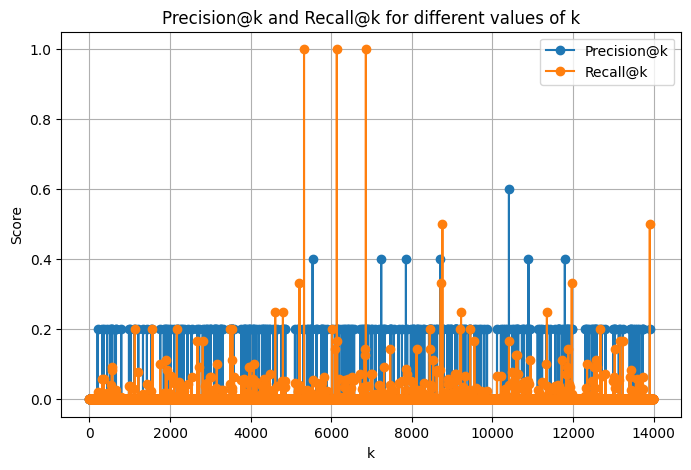

In [40]:
import matplotlib.pyplot as plt
ks = list(range(1, 13987))

plt.figure(figsize=(8, 5))
plt.plot(ks, precision_list, marker='o', label='Precision@k')
plt.plot(ks, recall_list, marker='o', label='Recall@k')
plt.xlabel('k')
plt.ylabel('Score')
plt.title('Precision@k and Recall@k for different values of k')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
train.to_csv("artifacts/data_train.csv", index= False)
test.to_csv("artifacts/data_test.csv", index= False)
